[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ozgeo\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


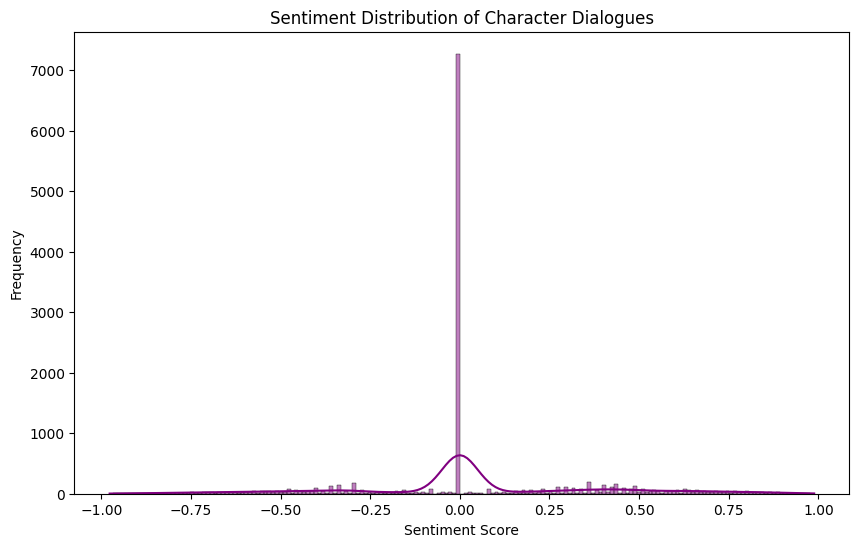

In [6]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from plotly.offline import init_notebook_mode
import seaborn as sns
import nltk

init_notebook_mode()

nltk.download('vader_lexicon')

# Load the dataset
avatar = pd.read_csv('avatar.csv', encoding='latin-1')

# Fill missing IMDb ratings with the average rating
avatar['imdb_rating'] = avatar['imdb_rating'].fillna(avatar['imdb_rating'].mean())

# Ensure all values in 'character_words' are strings
avatar['character_words'] = avatar['character_words'].astype(str)

# Extract books data
books = avatar.groupby('book').agg({'imdb_rating': 'mean'}).reset_index()

# Visualization of IMDb ratings across books
fig = px.bar(books, x='book', y='imdb_rating', template='simple_white', color_discrete_sequence=['#f18930'] * 3,
             opacity=0.6, text='imdb_rating', category_orders={'book': ['Water', 'Earth', 'Fire']},
             title='IMDb Rating Across Books')
fig.add_layout_image(
    dict(
        source="https://i.imgur.com/QWoqOZd.jpg",
        xref="x",
        yref="y",
        x=-0.5,
        y=10,
        sizex=3,
        sizey=10,
        opacity=0.7,
        sizing="stretch",
        layer="below")
)
fig.show()

# Detailed episode ratings
fig = px.bar(avatar, x='chapter', y='imdb_rating', color='book', hover_name='chapter', template='simple_white',
             color_discrete_map={'Fire': '#cd0000', 'Water': '#3399ff', 'Earth': '#663307'},
             labels={'imdb_rating': 'IMDb Rating', 'chapter': 'Chapter'})
fig.show()

# Analysis of director's impact on ratings
director_counts = avatar['director'].value_counts().reset_index()
director_counts.columns = ['Director Name', 'Number of Episodes']

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'bar'}, {'type': 'pie'}]], horizontal_spacing=0.2)

directorColors = ['#adbce6'] * 7
directorColors[5] = '#ba72d4'
director_rating = avatar.groupby('director').agg({'imdb_rating': 'mean'}).reset_index().sort_values(by='imdb_rating')
trace0 = go.Bar(y=director_rating['director'], x=director_rating['imdb_rating'], orientation='h',
                hovertext=director_rating['imdb_rating'], name='Director Average Ratings', marker_color=directorColors)
fig.add_trace(trace0, row=1, col=1)

trace1 = go.Pie(values=director_counts['Number of Episodes'], labels=director_counts['Director Name'],
                name='Director Number of Episodes')
fig.add_trace(trace1, row=1, col=2)

fig.update_layout(showlegend=False, title={'text': 'Directors and Their Average Rating', 'x': 0.5}, template='plotly_white')
fig.show()

# Character dialogues analysis
character_dialogues = pd.DataFrame({'Character': [], 'Number of Dialogues': [], 'Book': []})
for book in ['Water', 'Earth', 'Fire']:
    temp = avatar[avatar['book'] == book]['character'].value_counts().reset_index()
    temp.columns = ['Character', 'Number of Dialogues']
    temp['Book'] = book
    temp = temp.sort_values(by='Number of Dialogues', ascending=False)
    character_dialogues = pd.concat([character_dialogues, temp])

important_characters = ['Aang', 'Katara', 'Zuko', 'Sokka', 'Toph', 'Iroh', 'Azula']

# Dialogues Analysis by Book
bookColor = {'Fire': '#cd0000', 'Water': '#3399ff', 'Earth': '#663307'}
fig = make_subplots(rows=1, cols=3, subplot_titles=['Water', 'Earth', 'Fire'])
for i, book in enumerate(['Water', 'Earth', 'Fire']):
    temp = character_dialogues[(character_dialogues['Character'] != 'Scene Description') & (character_dialogues['Book'] == book)]
    trace = go.Bar(x=temp.iloc[:10][::-1]['Number of Dialogues'].values, y=temp.iloc[:10][::-1]['Character'].values,
                   orientation='h', marker_color=bookColor[book], name=book, opacity=0.8)
    fig.add_trace(trace, row=1, col=i + 1)
fig.update_layout(showlegend=False, template='plotly_white', title='Characters with Most Dialogues in Each Book')
fig.show()

# Sentiment analysis of character dialogues
sid = SentimentIntensityAnalyzer()
avatar['sentiment'] = avatar['character_words'].apply(lambda x: sid.polarity_scores(x)['compound'])

# Plot sentiment distribution
plt.figure(figsize=(10, 6))
sns.histplot(avatar['sentiment'], kde=True, color='purple')
plt.title('Sentiment Distribution of Character Dialogues')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

# Important Characters' Dialogues Analysis
fig = px.bar(character_dialogues[character_dialogues['Character'].isin(important_characters)], template='gridon',
             title='Important Characters Number of Dialogues each season', x='Number of Dialogues', y='Character',
             orientation='h', color='Book', barmode='group',
             color_discrete_map={'Fire': '#cd0000', 'Water': '#3399ff', 'Earth': '#663307'})
fig.add_layout_image(
    dict(
        source="https://vignette.wikia.nocookie.net/avatar/images/1/12/Azula.png",
        x=0.25,
        y=0.9,
    ))
fig.add_layout_image(
    dict(
        source="https://vignette.wikia.nocookie.net/avatar/images/4/46/Toph_Beifong.png",
        x=0.42,
        y=0.77,
    ))
fig.add_layout_image(
    dict(
        source="https://vignette.wikia.nocookie.net/avatar/images/c/c1/Iroh_smiling.png",
        x=0.35,
        y=0.6,
    ))
fig.add_layout_image(
    dict(
        source="https://vignette.wikia.nocookie.net/avatar/images/4/4b/Zuko.png",
        x=0.62,
        y=0.47,
    ))
fig.add_layout_image(
    dict(
        source="https://vignette.wikia.nocookie.net/avatar/images/cc/Sokka.png",
        x=0.85,
        y=0.32,
    ))
fig.add_layout_image(
    dict(
        source="https://static.wikia.nocookie.net/loveinterest/images/c/cb/Avatar_Last_Airbender_Book_1_Screenshot_0047.jpg",
        x=0.85,
        y=0.18,
    ))
fig.add_layout_image(
    dict(
        source="https://comicvine1.cbsistatic.com/uploads/scale_small/11138/111385676/7212562-5667359844-41703.jpg",
        x=1.05,
        y=0.052,
    ))
fig.update_layout_images(dict(
    xref="paper",
    yref="paper",
    sizex=0.09,
    sizey=0.09,
    xanchor="right",
    yanchor="bottom"
))
fig.show()

# Top episodes with the most dialogues
chapter_dialogues = pd.DataFrame({'Chapter': [], 'Number of Dialogues': [], 'Book': []})
dialogue_df = avatar[avatar['character'] != 'Scene Description']
for book in ['Water', 'Earth', 'Fire']:
    temp = dialogue_df[dialogue_df['book'] == book]['chapter'].value_counts().reset_index()
    temp.columns = ['Chapter', 'Number of Dialogues']
    temp['Book'] = book
    chapter_dialogues = pd.concat([chapter_dialogues, temp])
chapter_dialogues = chapter_dialogues.sort_values(by='Number of Dialogues')
colors = ['#cd0000' if x == 'Fire' else '#3399ff' if x == 'Water' else '#663307' for x in chapter_dialogues['Book']]

trace = go.Bar(x=chapter_dialogues.iloc[:20]['Number of Dialogues'], y=chapter_dialogues.iloc[:20]['Chapter'],
               orientation='h', marker_color=colors)
fig = go.Figure([trace])
fig.update_layout(title={'text': 'Top 20 Episodes with the Most Number of Dialogues', 'x': 0.5},
                 xaxis_title="Number of Dialogues", yaxis_title="Chapter Name", template='plotly_white')
fig.show()

# Episodes with the least dialogues per IMDb rating
ratings = []
for i in range(len(chapter_dialogues)):
    chapter = chapter_dialogues.iloc[i]['Chapter']
    imdb_rating = avatar[avatar['chapter'] == chapter]['imdb_rating'].mean()
    ratings.append(imdb_rating)
chapter_dialogues['IMDB Rating'] = ratings
chapter_dialogues['IMDB Rating'].fillna(9.7, inplace=True)
chapter_dialogues['Dialogues Per Rating'] = chapter_dialogues['Number of Dialogues'] / chapter_dialogues['IMDB Rating']

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ozgeo\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


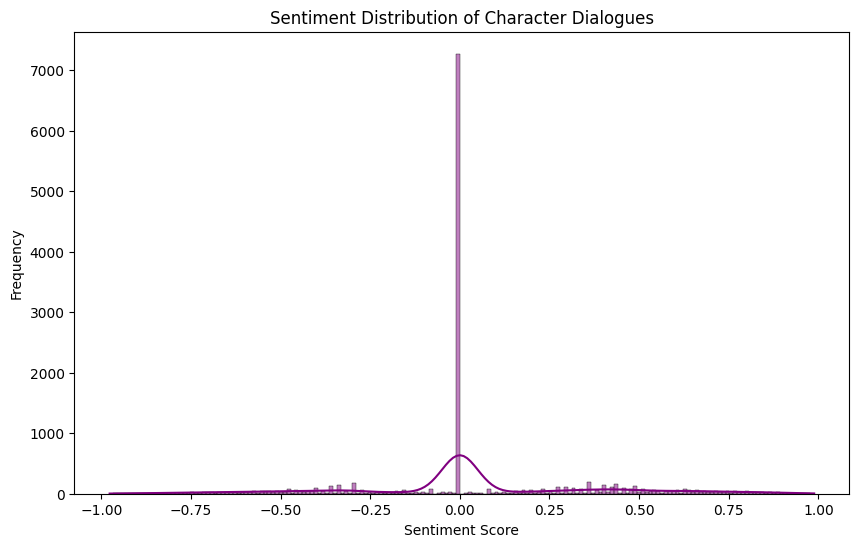

In [8]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from plotly.offline import init_notebook_mode
import seaborn as sns
import nltk

init_notebook_mode()

nltk.download('vader_lexicon')

# Load the dataset
avatar = pd.read_csv('avatar.csv', encoding='latin-1')

# Fill missing IMDb ratings with the average rating
avatar['imdb_rating'] = avatar['imdb_rating'].fillna(avatar['imdb_rating'].mean())

# Ensure all values in 'character_words' are strings
avatar['character_words'] = avatar['character_words'].astype(str)

# Extract books data
books = avatar.groupby('book').agg({'imdb_rating': 'mean'}).reset_index()

# Visualization of IMDb ratings across books
fig = px.bar(books, x='book', y='imdb_rating', template='simple_white', color_discrete_sequence=['#1f77b4'] * 3,
             opacity=0.7, text='imdb_rating', category_orders={'book': ['Water', 'Earth', 'Fire']},
             title='IMDb Rating Across Books')
fig.update_layout(title={'text': 'IMDb Ratings Across Books', 'x': 0.5})
fig.show()

# Detailed episode ratings
fig = px.scatter(avatar, x='chapter', y='imdb_rating', color='book', hover_name='chapter', template='simple_white',
                 color_discrete_map={'Fire': '#e377c2', 'Water': '#17becf', 'Earth': '#bcbd22'},
                 labels={'imdb_rating': 'IMDb Rating', 'chapter': 'Chapter'})
fig.update_traces(marker=dict(size=12, opacity=0.8), selector=dict(mode='markers'))
fig.show()

# Analysis of director's impact on ratings
director_counts = avatar['director'].value_counts().reset_index()
director_counts.columns = ['Director Name', 'Number of Episodes']

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'bar'}, {'type': 'pie'}]], horizontal_spacing=0.2)

directorColors = ['#ff7f0e'] * 7
directorColors[2] = '#d62728'
director_rating = avatar.groupby('director').agg({'imdb_rating': 'mean'}).reset_index().sort_values(by='imdb_rating')
trace0 = go.Bar(y=director_rating['director'], x=director_rating['imdb_rating'], orientation='h',
                hovertext=director_rating['imdb_rating'], name='Director Average Ratings', marker_color=directorColors)
fig.add_trace(trace0, row=1, col=1)

trace1 = go.Pie(values=director_counts['Number of Episodes'], labels=director_counts['Director Name'],
                name='Director Number of Episodes')
fig.add_trace(trace1, row=1, col=2)

fig.update_layout(showlegend=False, title={'text': 'Directors and Their Average Rating', 'x': 0.5}, template='simple_white')
fig.show()

# Character dialogues analysis
character_dialogues = pd.DataFrame({'Character': [], 'Number of Dialogues': [], 'Book': []})
for book in ['Water', 'Earth', 'Fire']:
    temp = avatar[avatar['book'] == book]['character'].value_counts().reset_index()
    temp.columns = ['Character', 'Number of Dialogues']
    temp['Book'] = book
    temp = temp.sort_values(by='Number of Dialogues', ascending=False)
    character_dialogues = pd.concat([character_dialogues, temp])

important_characters = ['Aang', 'Katara', 'Zuko', 'Sokka', 'Toph', 'Iroh', 'Azula']

# Dialogues Analysis by Book
bookColor = {'Fire': '#e377c2', 'Water': '#17becf', 'Earth': '#bcbd22'}
fig = make_subplots(rows=1, cols=3, subplot_titles=['Water', 'Earth', 'Fire'])
for i, book in enumerate(['Water', 'Earth', 'Fire']):
    temp = character_dialogues[(character_dialogues['Character'] != 'Scene Description') & (character_dialogues['Book'] == book)]
    trace = go.Bar(x=temp.iloc[:10][::-1]['Number of Dialogues'].values, y=temp.iloc[:10][::-1]['Character'].values,
                   orientation='h', marker_color=bookColor[book], name=book, opacity=0.8)
    fig.add_trace(trace, row=1, col=i + 1)
fig.update_layout(showlegend=False, template='simple_white', title='Characters with Most Dialogues in Each Book')
fig.show()

# Sentiment analysis of character dialogues
sid = SentimentIntensityAnalyzer()
avatar['sentiment'] = avatar['character_words'].apply(lambda x: sid.polarity_scores(x)['compound'])

# Plot sentiment distribution
plt.figure(figsize=(10, 6))
sns.histplot(avatar['sentiment'], kde=True, color='purple')
plt.title('Sentiment Distribution of Character Dialogues')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

# Important Characters' Dialogues Analysis
fig = px.bar(character_dialogues[character_dialogues['Character'].isin(important_characters)], template='simple_white',
             title='Important Characters Number of Dialogues each season', x='Number of Dialogues', y='Character',
             orientation='h', color='Book', barmode='group',
             color_discrete_map={'Fire': '#e377c2', 'Water': '#17becf', 'Earth': '#bcbd22'})
fig.show()

# Top episodes with the most dialogues
chapter_dialogues = pd.DataFrame({'Chapter': [], 'Number of Dialogues': [], 'Book': []})
dialogue_df = avatar[avatar['character'] != 'Scene Description']
for book in ['Water', 'Earth', 'Fire']:
    temp = dialogue_df[dialogue_df['book'] == book]['chapter'].value_counts().reset_index()
    temp.columns = ['Chapter', 'Number of Dialogues']
    temp['Book'] = book
    chapter_dialogues = pd.concat([chapter_dialogues, temp])
chapter_dialogues = chapter_dialogues.sort_values(by='Number of Dialogues')
colors = ['#e377c2' if x == 'Fire' else '#17becf' if x == 'Water' else '#bcbd22' for x in chapter_dialogues['Book']]

trace = go.Bar(x=chapter_dialogues.iloc[:20]['Number of Dialogues'], y=chapter_dialogues.iloc[:20]['Chapter'],
               orientation='h', marker_color=colors)
fig = go.Figure([trace])
fig.update_layout(title={'text': 'Top 20 Episodes with the Most Number of Dialogues', 'x': 0.5},
                 xaxis_title="Number of Dialogues", yaxis_title="Chapter Name", template='simple_white')
fig.show()

# Episodes with the least dialogues per IMDb rating
ratings = []
for i in range(len(chapter_dialogues)):
    chapter = chapter_dialogues.iloc[i]['Chapter']
    imdb_rating = avatar[avatar['chapter'] == chapter]['imdb_rating'].mean()
    ratings.append(imdb_rating)
chapter_dialogues['IMDB Rating'] = ratings
chapter_dialogues['IMDB Rating'].fillna(9.7, inplace=True)
chapter_dialogues['Dialogues Per Rating'] = chapter_dialogues['Number of Dialogues'] / chapter_dialogues['IMDB Rating']

# Plot Dialogues Per IMDb Rating
fig = px.bar(chapter_dialogues, x='Chapter', y='Dialogues Per Rating', color='Book', template='simple_white',
             title='Dialogues Per IMDb Rating', text='Dialogues Per Rating',
             color_discrete_map={'Fire': '#e377c2', 'Water': '#17becf', 'Earth': '#bcbd22'})
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.show()


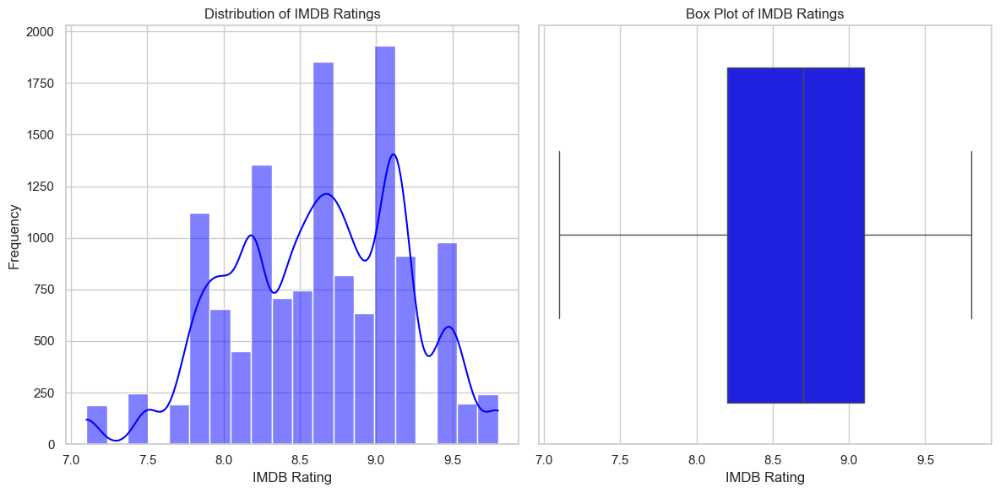

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:48: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:56: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




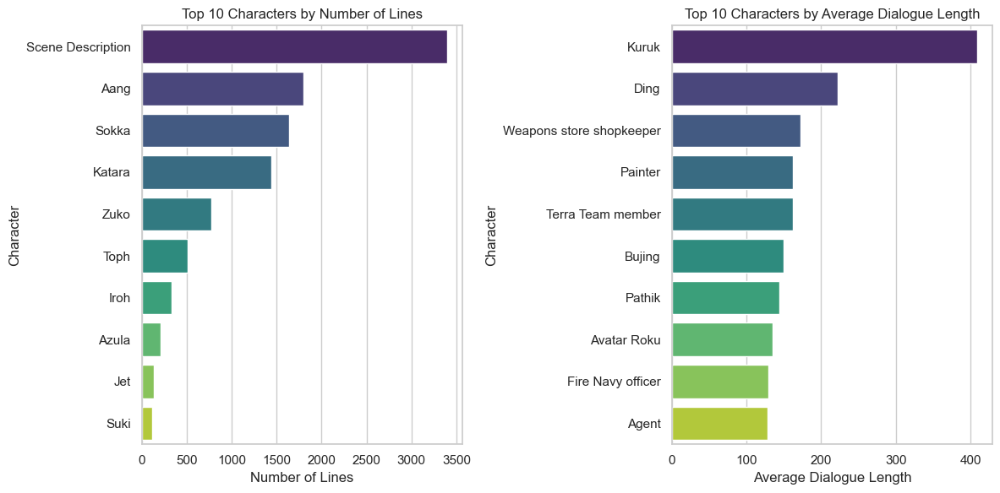

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:83: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:91: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:99: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




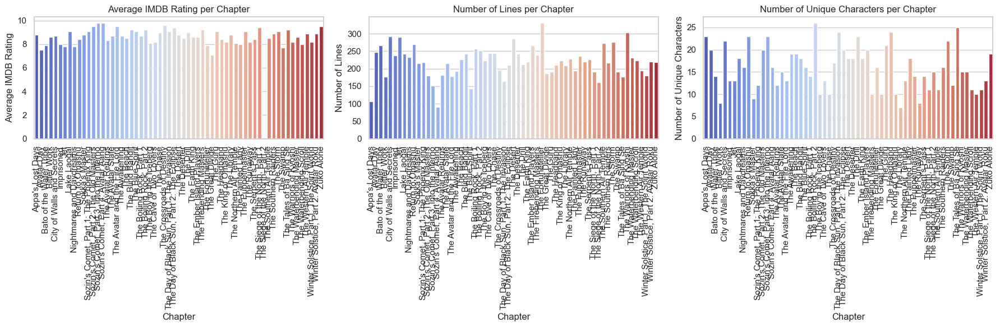

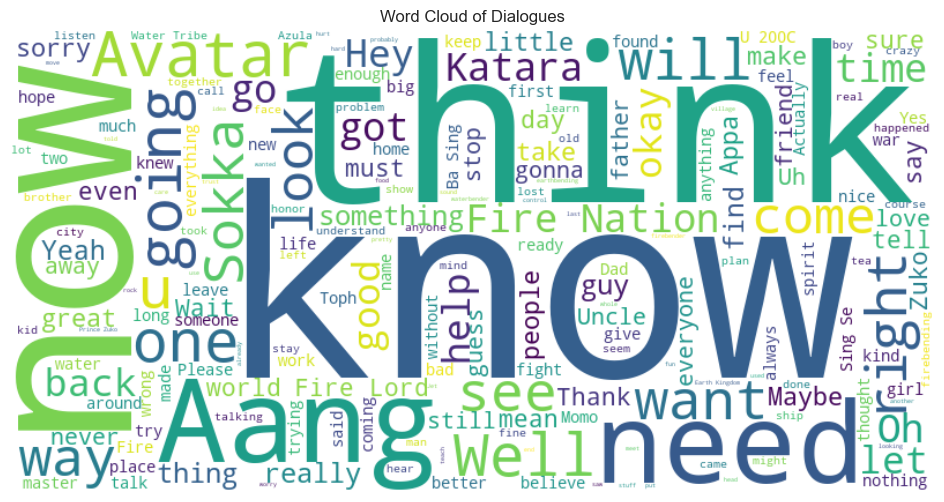

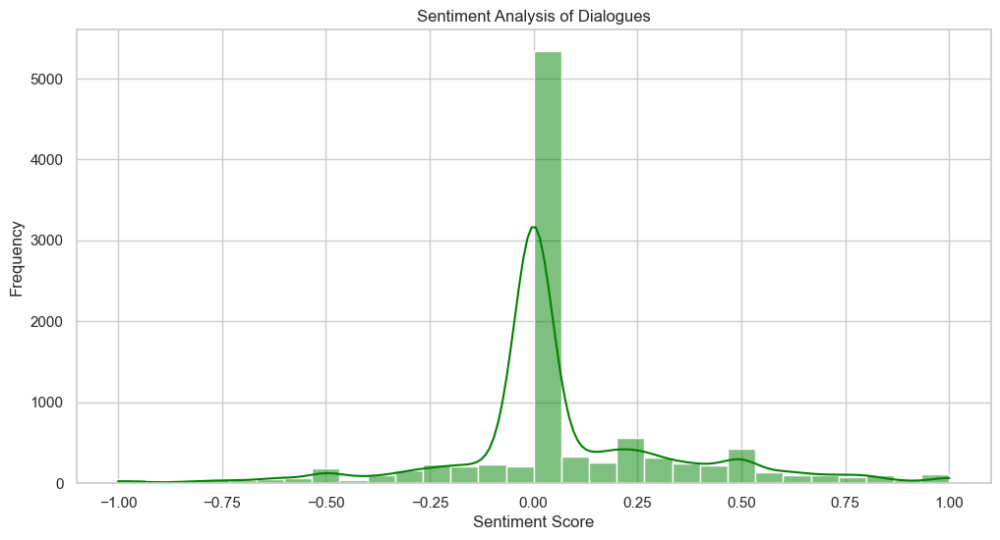

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\2168085309.py:137: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




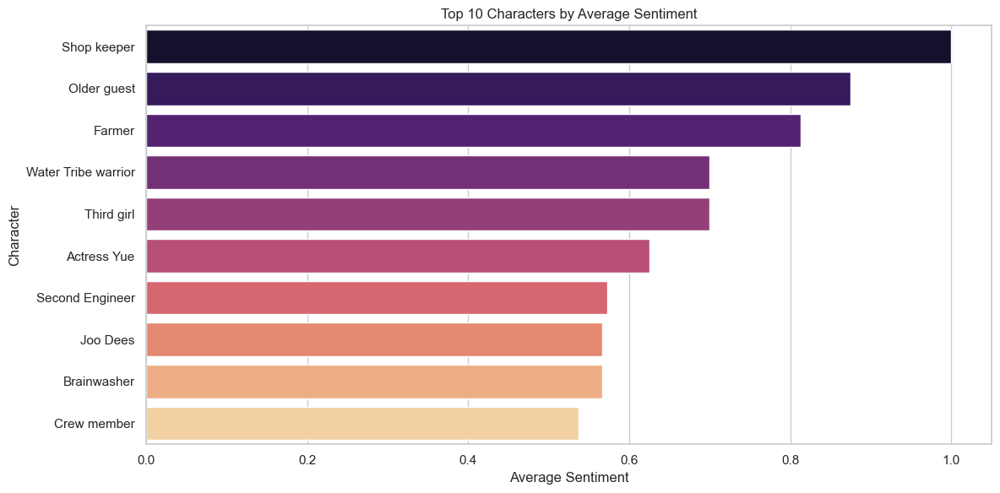

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from textblob import TextBlob

# Load the dataset
file_path = 'avatar.csv'
data = pd.read_csv(file_path, encoding='ISO-8859-1')

# Set the plot style
sns.set(style="whitegrid")

# 1. Distribution of IMDB Ratings
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data['imdb_rating'], bins=20, kde=True, color='blue')
plt.title('Distribution of IMDB Ratings')
plt.xlabel('IMDB Rating')
plt.ylabel('Frequency')

# Box plot
plt.subplot(1, 2, 2)
sns.boxplot(x=data['imdb_rating'], color='blue')
plt.title('Box Plot of IMDB Ratings')
plt.xlabel('IMDB Rating')

plt.tight_layout()
plt.show()

# 2. Character Analysis

# Number of lines per character
character_lines = data['character'].value_counts().reset_index()
character_lines.columns = ['character', 'line_count']

# Average length of dialogue per character
data['dialogue_length'] = data['character_words'].str.len()
character_dialogue_length = data.groupby('character')['dialogue_length'].mean().reset_index()

# Plotting the number of lines per character
plt.figure(figsize=(12, 6))

# Bar plot for number of lines
plt.subplot(1, 2, 1)
sns.barplot(y=character_lines['character'][:10], x=character_lines['line_count'][:10], palette='viridis')
plt.title('Top 10 Characters by Number of Lines')
plt.xlabel('Number of Lines')
plt.ylabel('Character')

# Bar plot for average length of dialogue
plt.subplot(1, 2, 2)
top_characters = character_dialogue_length.sort_values(by='dialogue_length', ascending=False)[:10]
sns.barplot(y=top_characters['character'], x=top_characters['dialogue_length'], palette='viridis')
plt.title('Top 10 Characters by Average Dialogue Length')
plt.xlabel('Average Dialogue Length')
plt.ylabel('Character')

plt.tight_layout()
plt.show()

# 3. Chapter Analysis

# Average IMDB rating per chapter
chapter_ratings = data.groupby('chapter')['imdb_rating'].mean().reset_index()

# Number of lines and unique characters per chapter
chapter_lines = data['chapter'].value_counts().reset_index()
chapter_lines.columns = ['chapter', 'line_count']
chapter_characters = data.groupby('chapter')['character'].nunique().reset_index()
chapter_characters.columns = ['chapter', 'unique_characters']

# Merging the chapter data
chapter_analysis = chapter_ratings.merge(chapter_lines, on='chapter').merge(chapter_characters, on='chapter')

# Plotting the chapter analysis
plt.figure(figsize=(18, 6))

# Average IMDB rating per chapter
plt.subplot(1, 3, 1)
sns.barplot(x=chapter_analysis['chapter'], y=chapter_analysis['imdb_rating'], palette='coolwarm')
plt.title('Average IMDB Rating per Chapter')
plt.xlabel('Chapter')
plt.ylabel('Average IMDB Rating')
plt.xticks(rotation=90)

# Number of lines per chapter
plt.subplot(1, 3, 2)
sns.barplot(x=chapter_analysis['chapter'], y=chapter_analysis['line_count'], palette='coolwarm')
plt.title('Number of Lines per Chapter')
plt.xlabel('Chapter')
plt.ylabel('Number of Lines')
plt.xticks(rotation=90)

# Number of unique characters per chapter
plt.subplot(1, 3, 3)
sns.barplot(x=chapter_analysis['chapter'], y=chapter_analysis['unique_characters'], palette='coolwarm')
plt.title('Number of Unique Characters per Chapter')
plt.xlabel('Chapter')
plt.ylabel('Number of Unique Characters')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# 4. Text Analysis

# Generate word cloud for the dialogues
text = ' '.join(data['character_words'].dropna().astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plotting the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Dialogues')
plt.show()

# Sentiment analysis using TextBlob
data['sentiment'] = data['character_words'].dropna().apply(lambda x: TextBlob(x).sentiment.polarity)

# Plotting the sentiment analysis
plt.figure(figsize=(12, 6))
sns.histplot(data['sentiment'], bins=30, kde=True, color='green')
plt.title('Sentiment Analysis of Dialogues')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

# Character-based sentiment analysis
character_sentiment = data.groupby('character')['sentiment'].mean().reset_index().sort_values(by='sentiment', ascending=False)

# Plotting character-based sentiment analysis
plt.figure(figsize=(12, 6))
sns.barplot(y=character_sentiment['character'][:10], x=character_sentiment['sentiment'][:10], palette='magma')
plt.title('Top 10 Characters by Average Sentiment')
plt.xlabel('Average Sentiment')
plt.ylabel('Character')
plt.tight_layout()
plt.show()


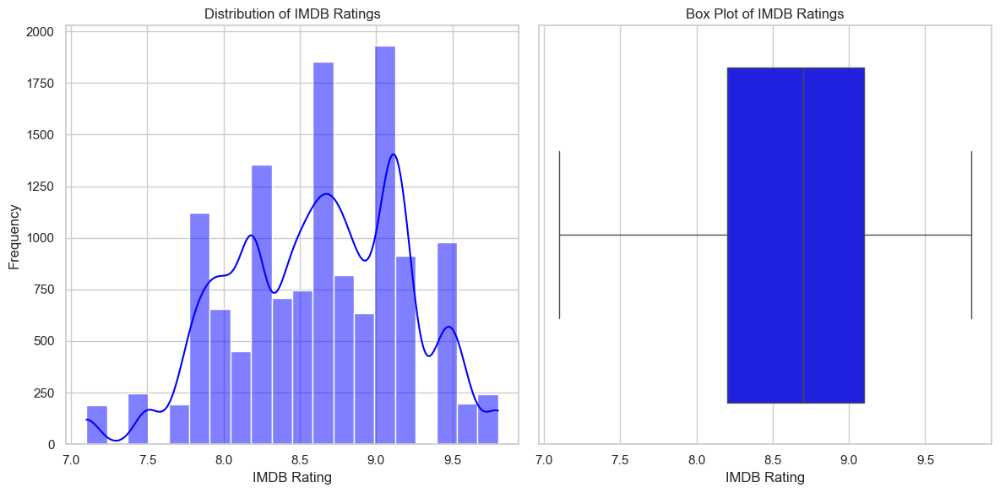

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




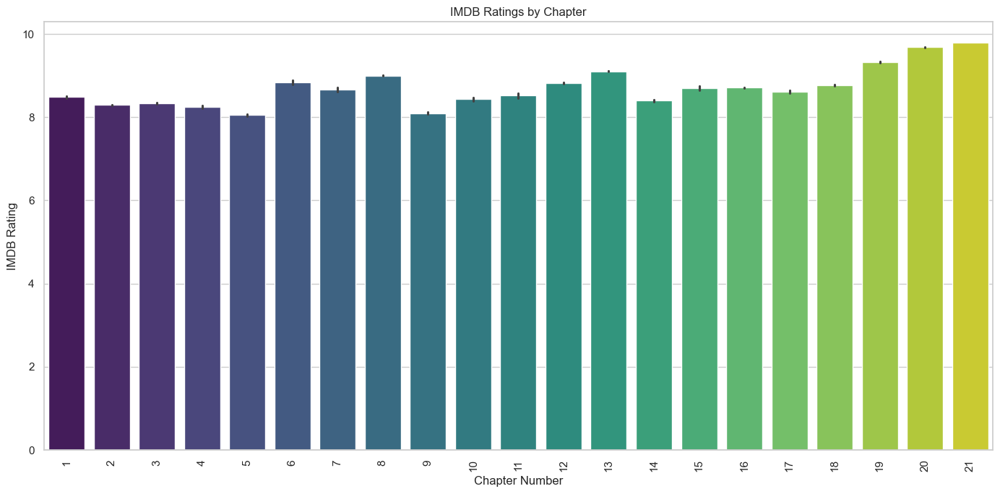

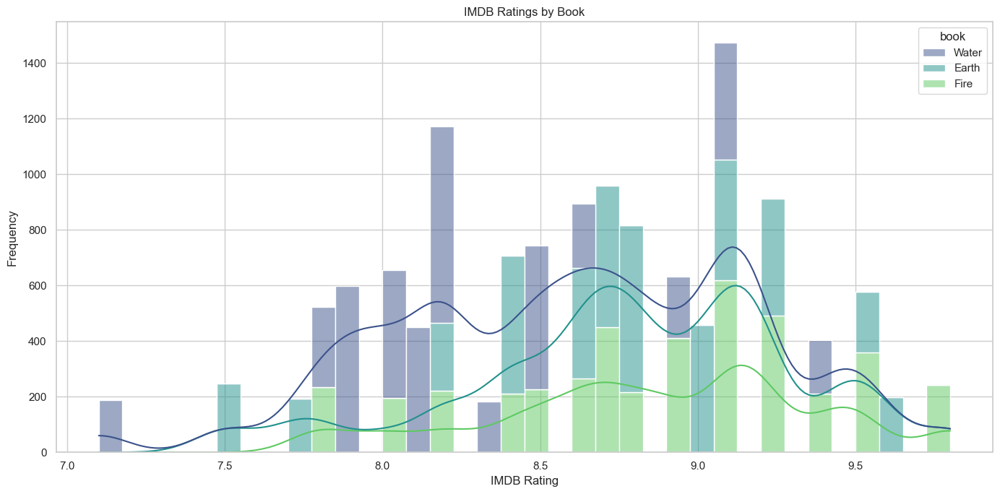

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:62: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




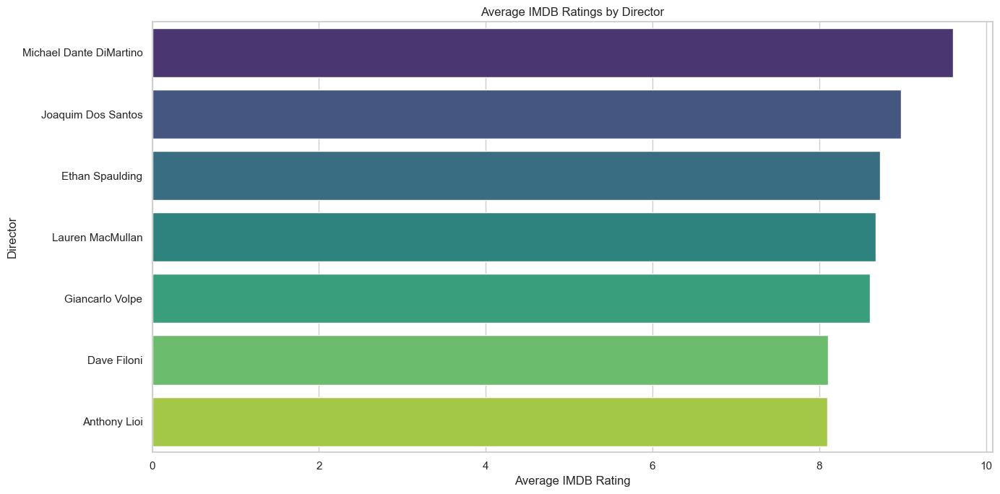

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:70: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




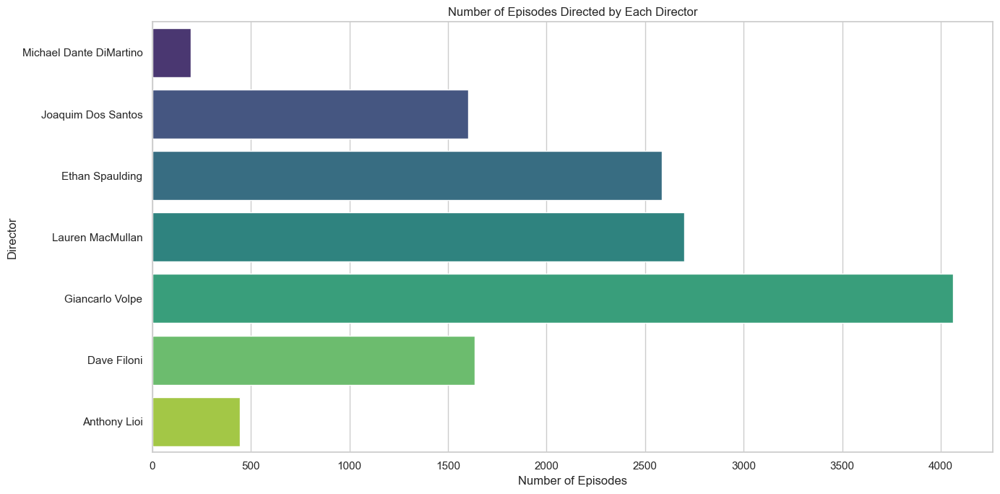

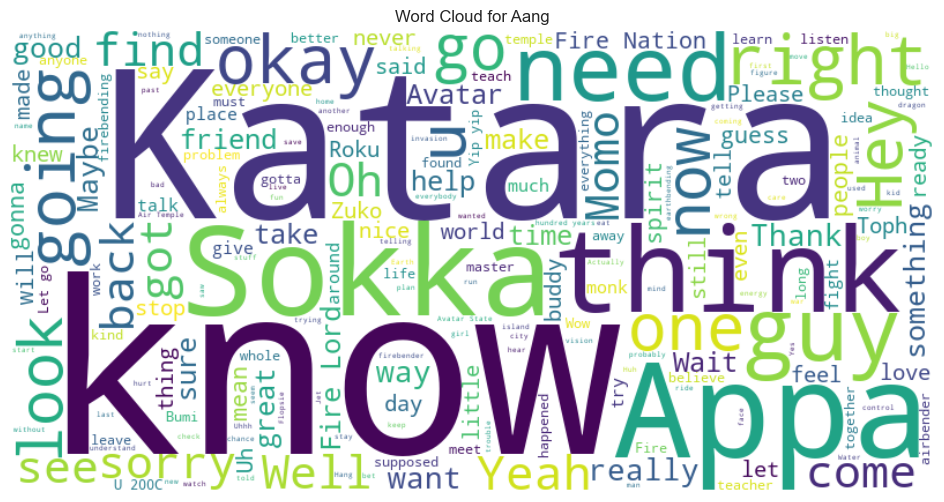

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



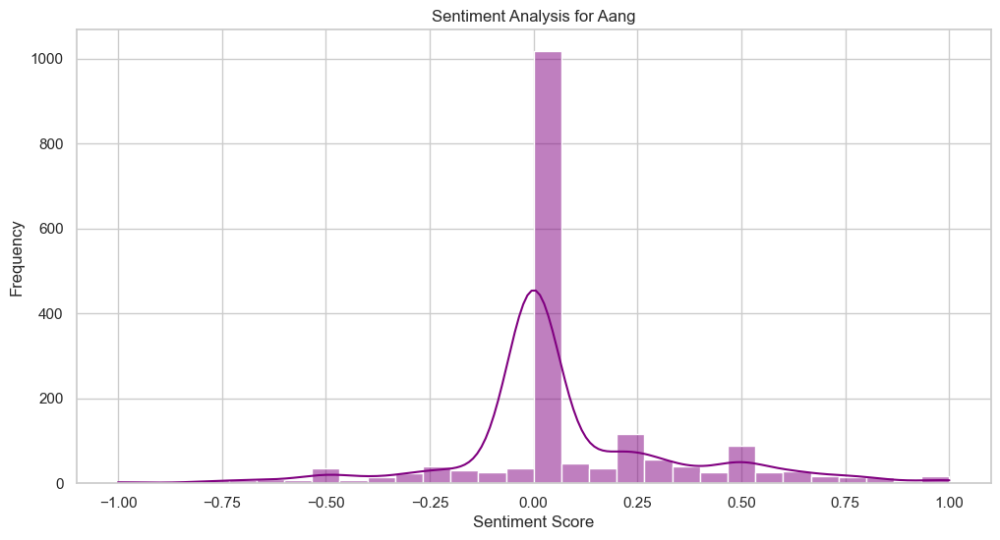

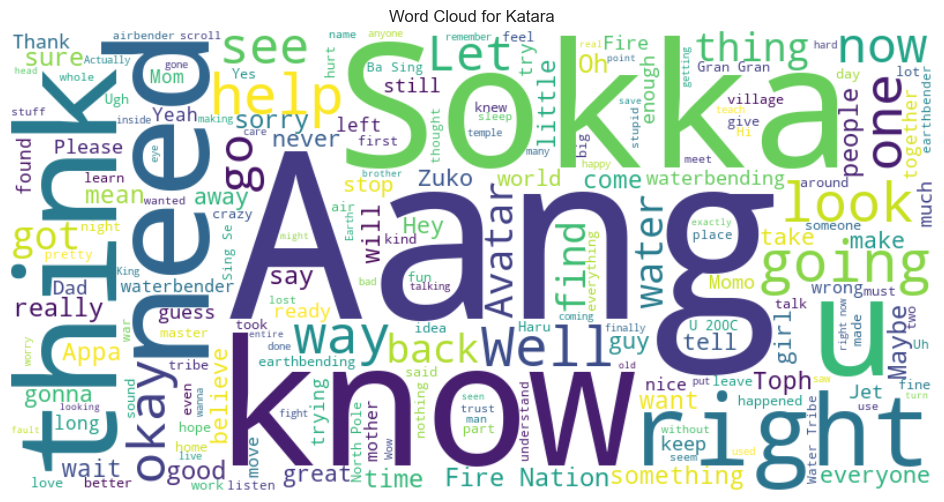

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



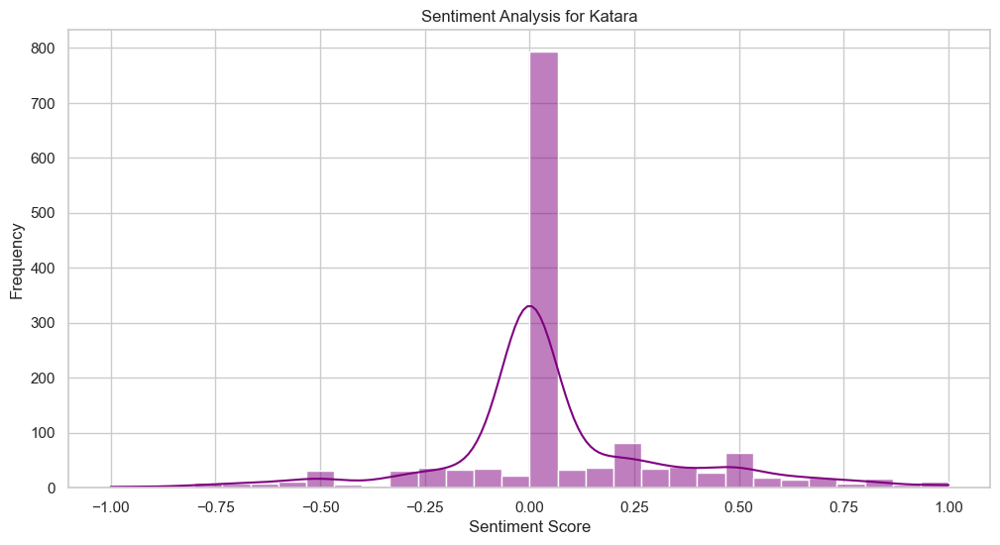

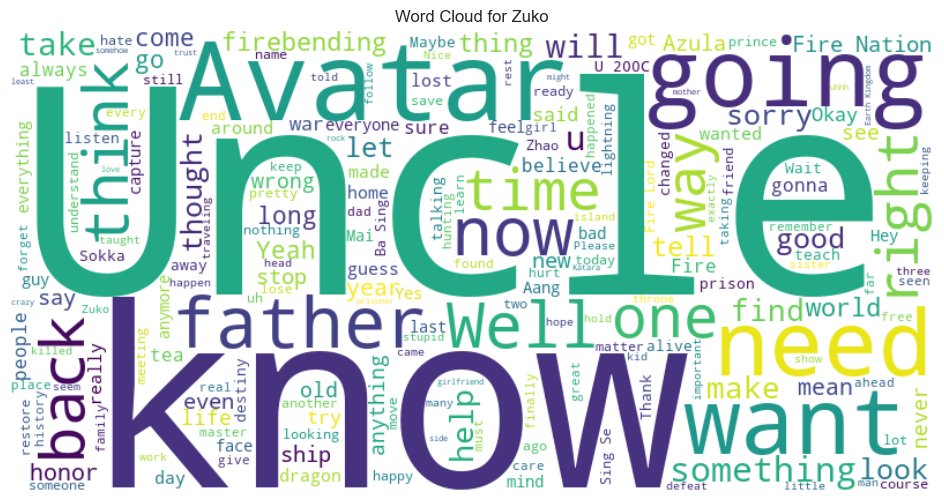

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



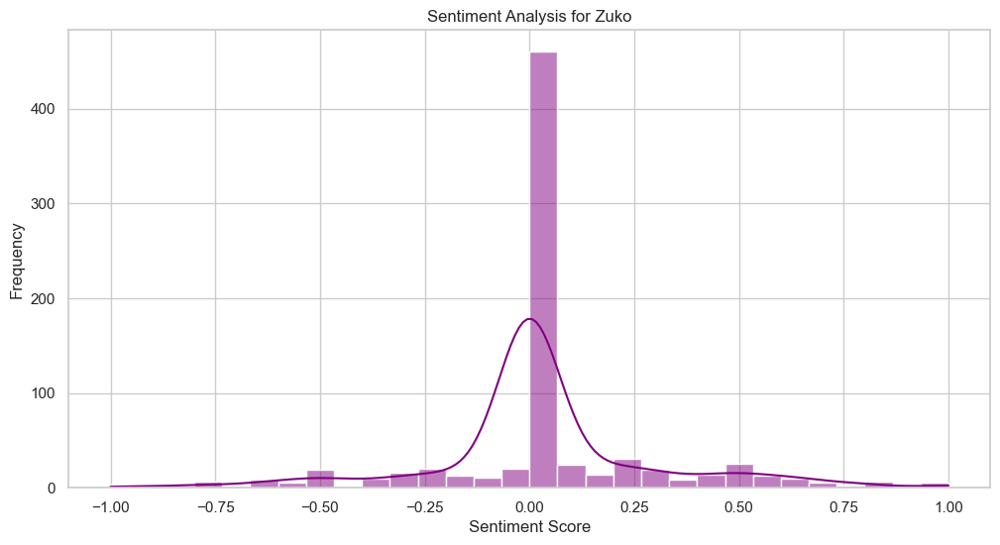

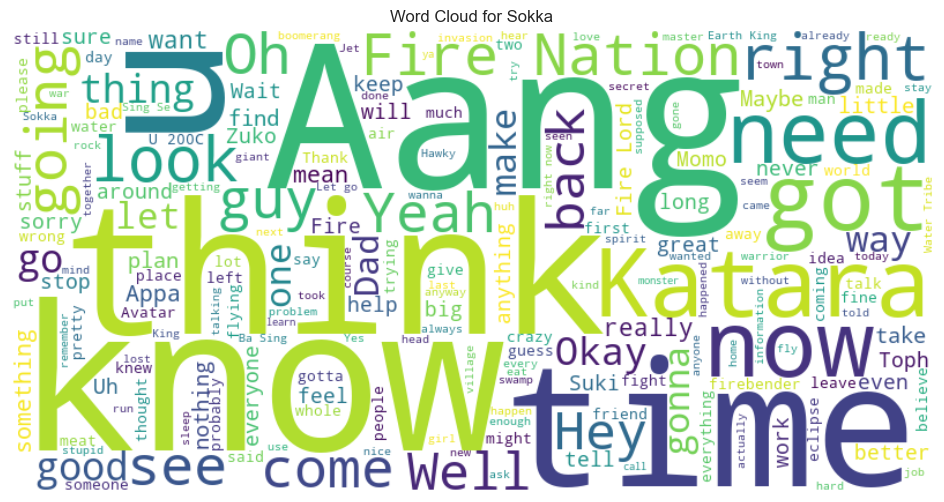

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



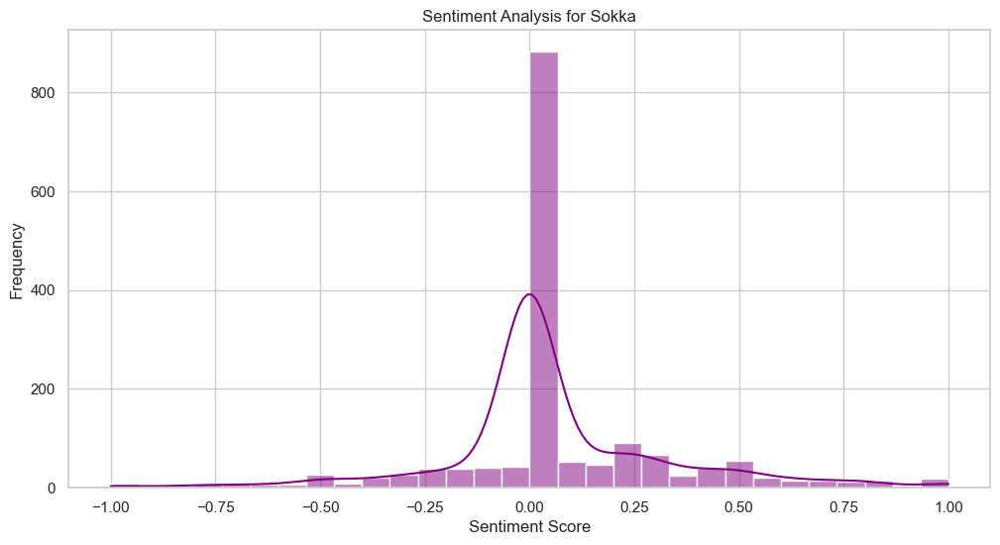

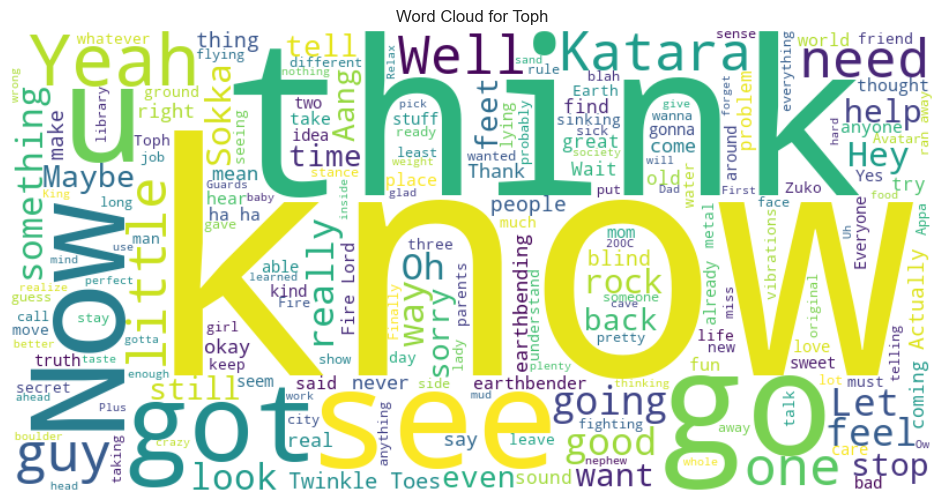

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



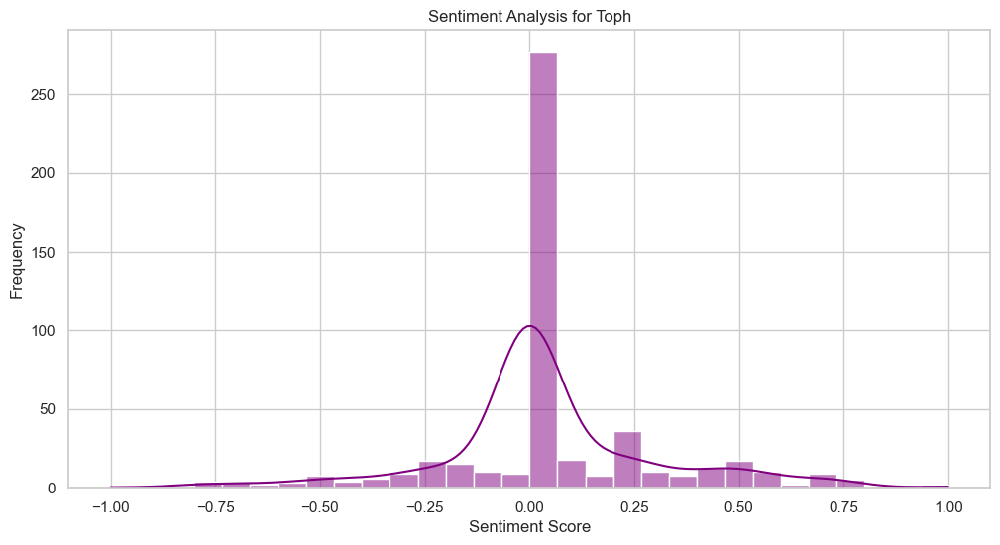

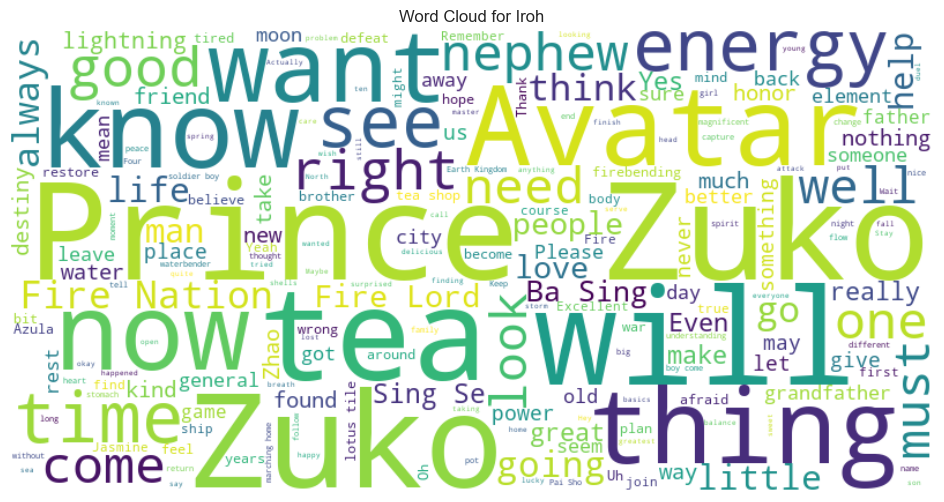

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



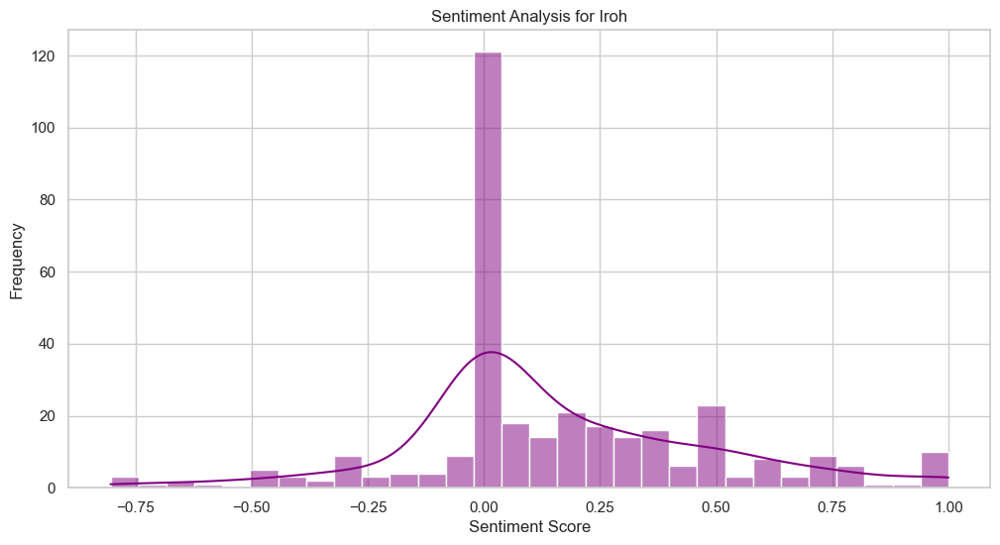

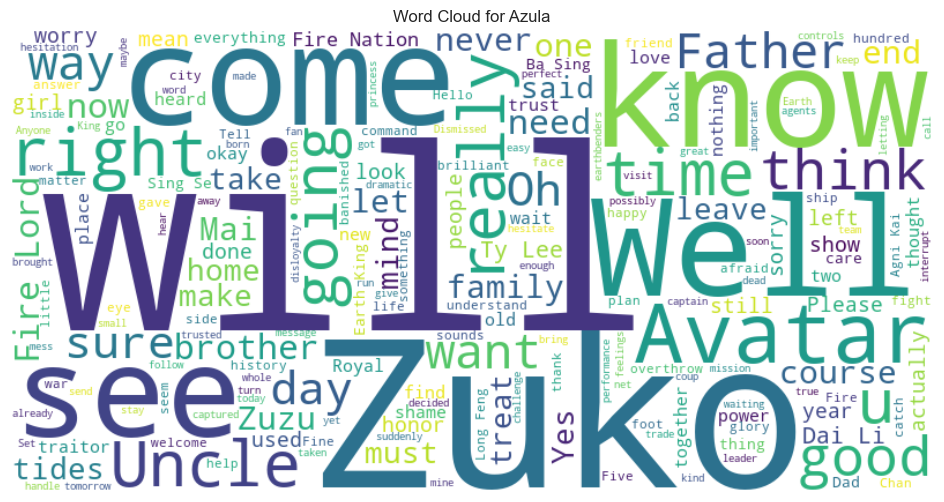

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:98: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



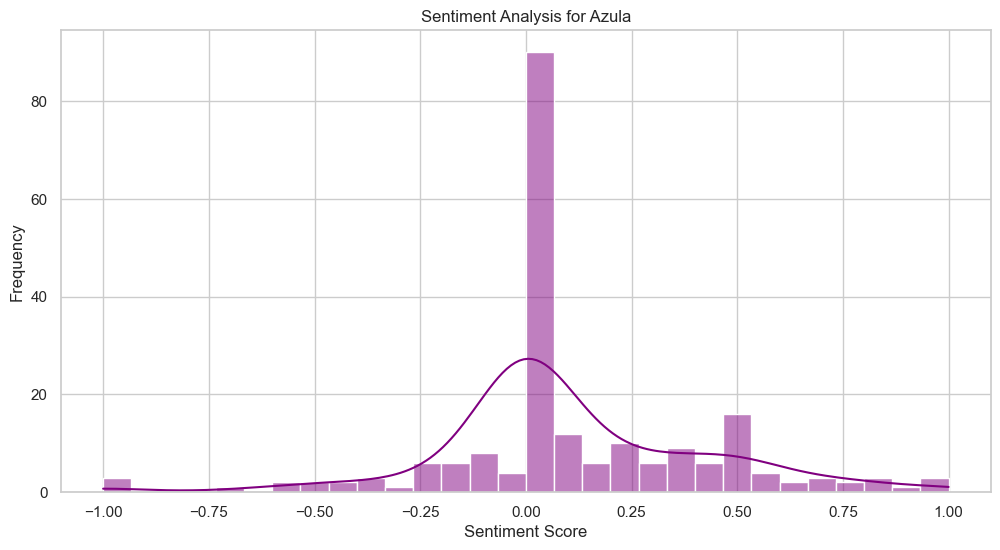

C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:122: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ozgeo\AppData\Local\Temp\ipykernel_21832\4155624438.py:130: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




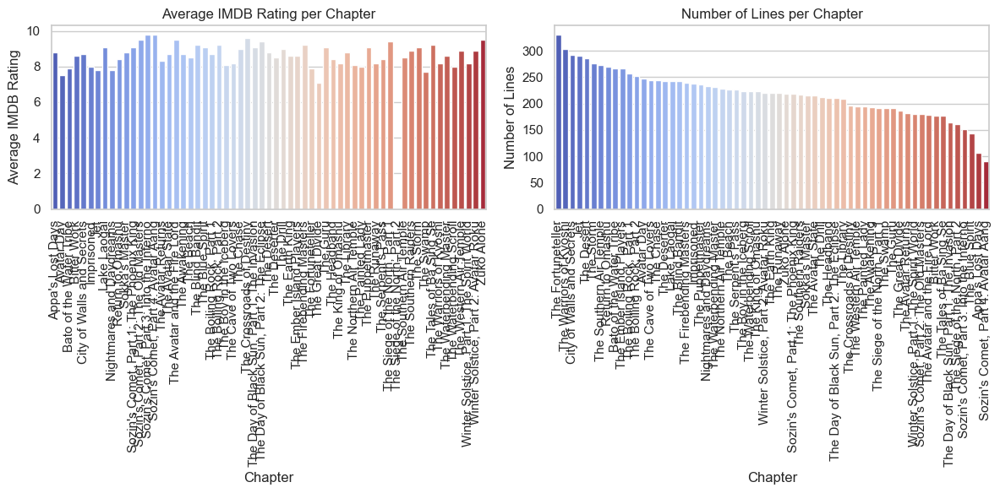

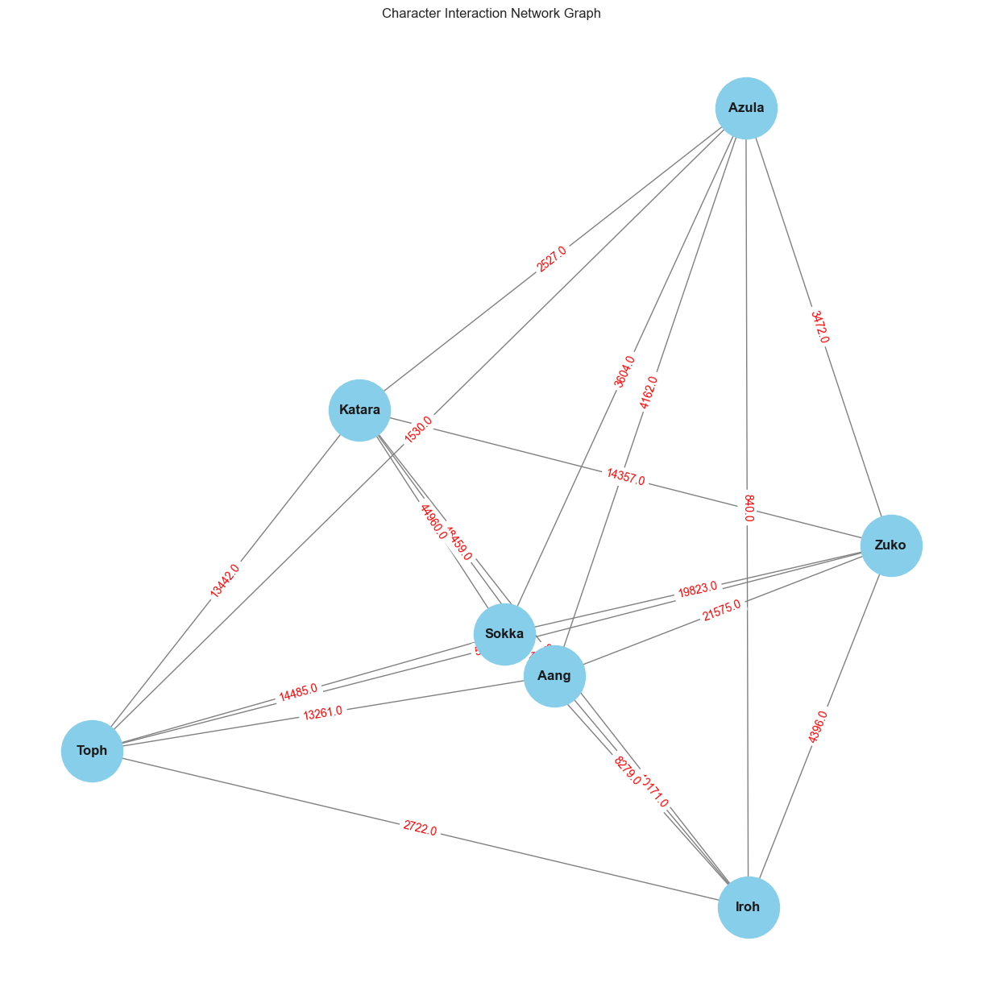

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from wordcloud import WordCloud
from textblob import TextBlob

# Load the dataset
file_path = 'avatar.csv'
data = pd.read_csv(file_path, encoding='ISO-8859-1')

# Set the plot style
sns.set(style="whitegrid")

# 1. Distribution of IMDB Ratings
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data['imdb_rating'], bins=20, kde=True, color='blue')
plt.title('Distribution of IMDB Ratings')
plt.xlabel('IMDB Rating')
plt.ylabel('Frequency')

# Box plot
plt.subplot(1, 2, 2)
sns.boxplot(x=data['imdb_rating'], color='blue')
plt.title('Box Plot of IMDB Ratings')
plt.xlabel('IMDB Rating')

plt.tight_layout()
plt.show()

# Set the plot style
sns.set(style="whitegrid")

# 1. IMDB Ratings by Chapter
plt.figure(figsize=(14, 7))
sns.barplot(x='chapter_num', y='imdb_rating', data=data, palette='viridis')
plt.title('IMDB Ratings by Chapter')
plt.xlabel('Chapter Number')
plt.ylabel('IMDB Rating')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 2. IMDB Ratings by Book
plt.figure(figsize=(14, 7))
sns.histplot(data, x='imdb_rating', hue='book', multiple='stack', palette='viridis', kde=True)
plt.title('IMDB Ratings by Book')
plt.xlabel('IMDB Rating')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# 3. IMDB Ratings by Director
# Group by director and calculate mean and count of IMDB ratings
director_ratings = data.groupby('director')['imdb_rating'].agg(['mean', 'count']).reset_index()
director_ratings = director_ratings.sort_values(by='mean', ascending=False)

plt.figure(figsize=(14, 7))
sns.barplot(x='mean', y='director', data=director_ratings, palette='viridis', orient='h')
plt.title('Average IMDB Ratings by Director')
plt.xlabel('Average IMDB Rating')
plt.ylabel('Director')
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 7))
sns.barplot(x='count', y='director', data=director_ratings, palette='viridis', orient='h')
plt.title('Number of Episodes Directed by Each Director')
plt.xlabel('Number of Episodes')
plt.ylabel('Director')
plt.tight_layout()
plt.show()

# 2. Character-based Word Clouds and Sentiment Analysis

# Generate word clouds and sentiment analysis for each character
characters = ['Aang', 'Katara', 'Zuko', 'Sokka', 'Toph', 'Iroh', 'Azula']

for character in characters:
    character_data = data[data['character'] == character]
    
    if not character_data['character_words'].dropna().empty:
        # Generate word cloud
        character_text = ' '.join(character_data['character_words'].dropna().astype(str).tolist())
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(character_text)
        
        # Plotting the word cloud
        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {character}')
        plt.show()
        
        # Sentiment analysis using TextBlob
        character_data['sentiment'] = character_data['character_words'].dropna().apply(lambda x: TextBlob(x).sentiment.polarity)
        
        # Plotting the sentiment analysis
        plt.figure(figsize=(12, 6))
        sns.histplot(character_data['sentiment'], bins=30, kde=True, color='purple')
        plt.title(f'Sentiment Analysis for {character}')
        plt.xlabel('Sentiment Score')
        plt.ylabel('Frequency')
        plt.show()

# 3. Simplified Chapter Analysis

# Average IMDB rating per chapter
chapter_ratings = data.groupby('chapter')['imdb_rating'].mean().reset_index()

# Number of lines per chapter
chapter_lines = data['chapter'].value_counts().reset_index()
chapter_lines.columns = ['chapter', 'line_count']

# Simplified chapter plot
plt.figure(figsize=(12, 6))

# Average IMDB rating per chapter
plt.subplot(1, 2, 1)
sns.barplot(x=chapter_ratings['chapter'], y=chapter_ratings['imdb_rating'], palette='coolwarm')
plt.title('Average IMDB Rating per Chapter')
plt.xlabel('Chapter')
plt.ylabel('Average IMDB Rating')
plt.xticks(rotation=90)

# Number of lines per chapter
plt.subplot(1, 2, 2)
sns.barplot(x=chapter_lines['chapter'], y=chapter_lines['line_count'], palette='coolwarm')
plt.title('Number of Lines per Chapter')
plt.xlabel('Chapter')
plt.ylabel('Number of Lines')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# List of important characters
important_characters = ['Aang', 'Katara', 'Zuko', 'Sokka', 'Toph', 'Iroh', 'Azula']

# Filter data to only include interactions between important characters
filtered_data = data[data['character'].isin(important_characters)]

# Create a co-occurrence matrix
co_occurrence = pd.crosstab(filtered_data['chapter'], filtered_data['character'])

# Compute the co-occurrence matrix
interaction_matrix = co_occurrence.T.dot(co_occurrence)
interaction_matrix = interaction_matrix.where(~np.eye(interaction_matrix.shape[0], dtype=bool))

# Build the interaction graph
G = nx.Graph()

# Add nodes
for character in important_characters:
    G.add_node(character)

# Add edges
for i, character1 in enumerate(important_characters):
    for j, character2 in enumerate(important_characters):
        if i < j and interaction_matrix.loc[character1, character2] > 0:
            G.add_edge(character1, character2, weight=interaction_matrix.loc[character1, character2])

# Visualize the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_size=3000, node_color='skyblue', edge_color='grey', font_size=12, font_weight='bold')
nx.draw_networkx_edge_labels(G, pos, edge_labels={(u, v): f'{d["weight"]}' for u, v, d in G.edges(data=True)}, font_color='red')
plt.title('Character Interaction Network Graph')
plt.show()
